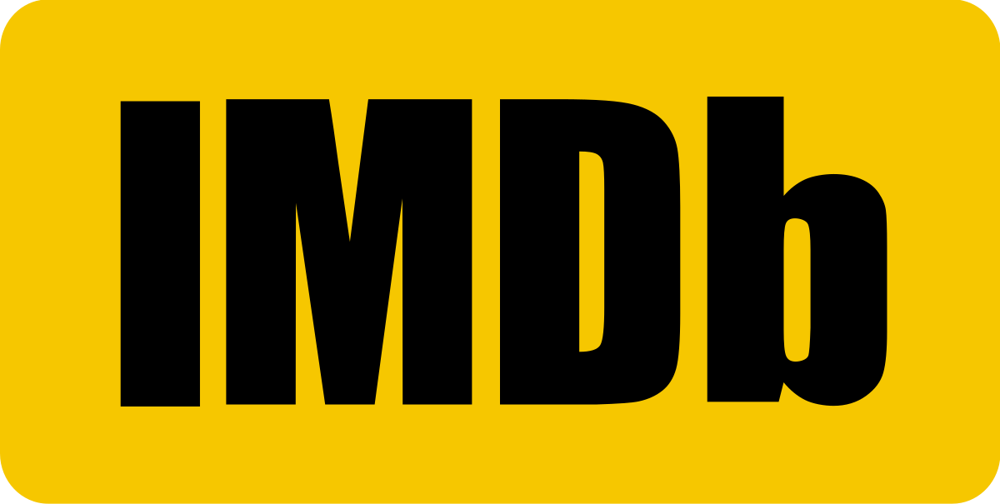

In [1]:
import java.io.File
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/imdb_logo.png"))
DISPLAY(image)

In [2]:
USE {
    dependencies("org.mariadb.jdbc:mariadb-java-client:3.1.4")
}

In [3]:
%use dataframe, kandy

In [4]:
import org.jetbrains.kotlinx.dataframe.DataFrame
import org.jetbrains.kotlinx.dataframe.api.describe
import org.jetbrains.kotlinx.dataframe.api.print
import org.jetbrains.kotlinx.dataframe.io.DatabaseConfiguration
import org.jetbrains.kotlinx.dataframe.io.getSchemaForSqlTable
import org.jetbrains.kotlinx.dataframe.io.readSqlTable
import org.jetbrains.kotlinx.dataframe.io.getSchemaForAllSqlTables
import org.jetbrains.kotlinx.dataframe.schema.DataFrameSchema
import java.sql.DriverManager
import java.util.*


# The IMDB Database Exploration: Part II - Some Data Analysis With You
This notebook demonstrates how to perform exploratory data analysis on the IMDB database using the Kotlin DataFrame library.

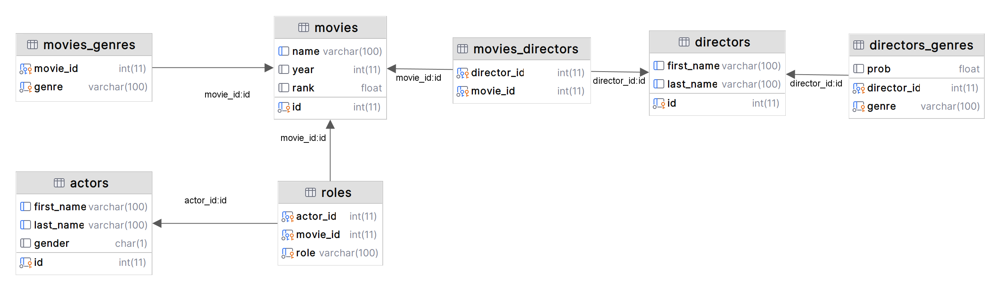

In [9]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/schema.png"))
DISPLAY(image)

In [5]:
val URL = "jdbc:mariadb://localhost:3307/imdb"
val USER_NAME = "root"
val PASSWORD = "pass"

val dbConfig = DatabaseConfiguration(URL, USER_NAME, PASSWORD)

# Let's try to find an actor who plays in the II episode of Star Wars and was a good Jedy (I forgot his name)
In this chapter we will read all data from `movies` SQL table and find all movies related to Star Wars.

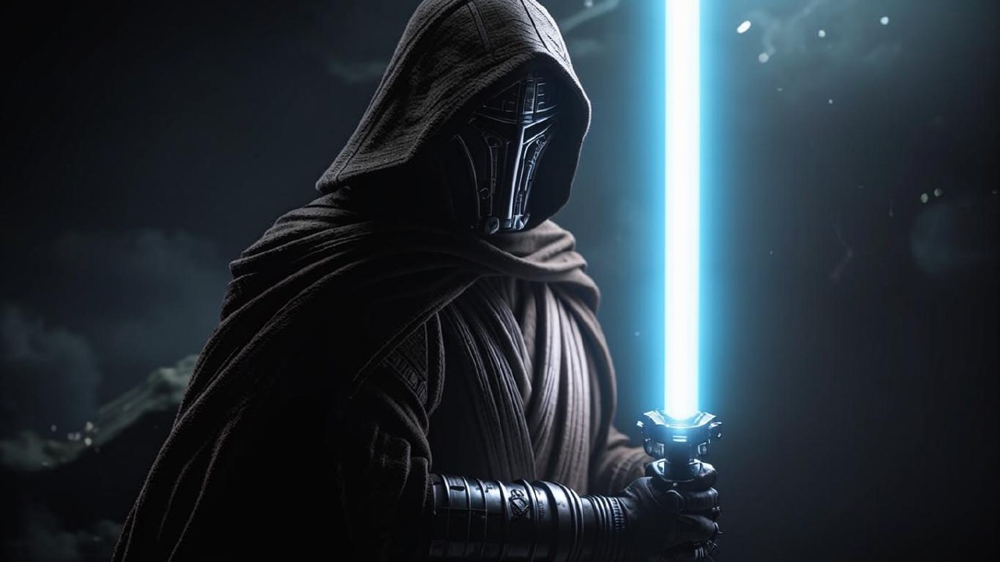

In [11]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/jedy.png"))
DISPLAY(image)

In [6]:
val movies = DataFrame.readSqlTable(dbConfig, "movies")
movies

id,name,year,rank
0,#28,2002,null
1,"#7 Train: An Immigrant Journey, The",2000,null
2,$,1971,"6,400000"
3,"$1,000 Reward",1913,null
4,"$1,000 Reward",1915,null
5,"$1,000 Reward",1923,null
6,"$1,000,000 Duck",1971,"5,000000"
7,"$1,000,000 Reward, The",1920,null
8,"$10,000 Under a Pillow",1921,null
9,"$100,000",1915,null


In [8]:
movies.filter { it.name!!.contains("Star Wars") }

id,name,year,rank
100121,Empire of Dreams: The Story of the St...,2004,null
120586,From Star Wars to Jedi: The Making of...,1985,null
120587,From Star Wars to Star Wars: The Stor...,1999,null
201763,"Making of 'Star Wars', The",1977,null
218226,Monopoly Star Wars,1997,null
238739,"Official Star Wars Fan Film Awards, The",2002,null
269552,Quentin Tarantino's Star Wars,1998,null
289116,Saving Star Wars,2004,"8,500000"
313459,Star Wars,1977,"8,800000"
313460,Star Wars,1983,null


__"Star Wars: Episode II - Attack of the Clones"__

Ok, let's keep for future generation the id of this movie: **313476**

# Let's observe all roles in the II episode
Sorry, but I don't remember exactly the name of the person, probably scrolling through data could help me...

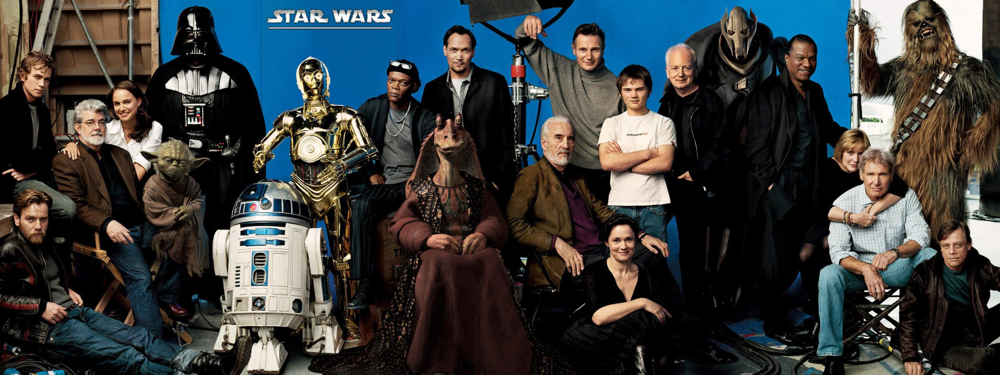

In [12]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/roles.jpg"))
DISPLAY(image)

In [13]:
val roles = DataFrame.readSqlTable(dbConfig = dbConfig, "roles")
roles

actor_id,movie_id,role
2,280088,Stevie
2,396232,Various/lyricist
3,376687,Gitano 1
4,336265,El Cigala
5,135644,Himself
6,12083,
7,252053,
7,402635,
7,409592,Staff Humorist (1996)
8,101866,


In [14]:
roles.filter { it.movie_id == 313476 }

actor_id,movie_id,role
24298,313476,R2-D2
40927,313476,Jar Jar Binks
45151,313476,Oppo Rancisis
49333,313476,Saesee Tiin
53063,313476,Mas Amedda
53764,313476,Ask Aak
75208,313476,Ki-Adi-Mundi/Vicroy Nute Gunr
85697,313476,Anakin Skywalker
88845,313476,Ister Paddie
102313,313476,Geonosian Archduke Poggle the


Hmmm, we could only see the `id` from `actors` SQL table.

Let's keep the id `225014` for future search!

# Great, I found him, and he looks so familiar!!! 

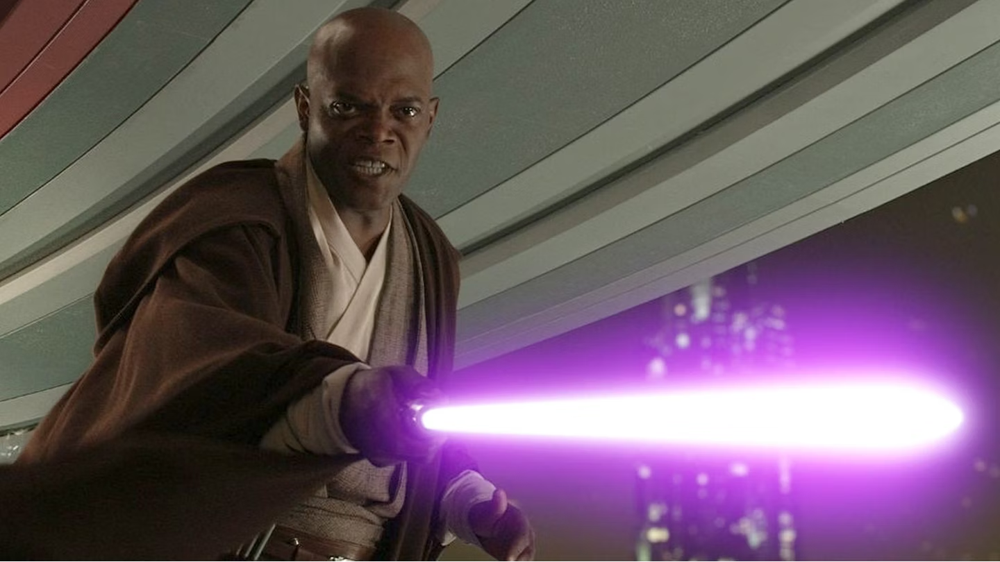

In [15]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/macewindu.png"))
DISPLAY(image)

# But I forgot the name of the actor who plays Mace Windu :(

In [18]:
val actors = DataFrame.readSqlTable(dbConfig, "actors")
actors

id,first_name,last_name,gender
2,Michael,'babeepower' Viera,M
3,Eloy,'Chincheta',M
4,Dieguito,'El Cigala',M
5,Antonio,'El de Chipiona',M
6,José,'El Francés',M
7,Félix,'El Gato',M
8,Marcial,'El Jalisco',M
9,José,'El Morito',M
10,Francisco,'El Niño de la Manola',M
11,Víctor,'El Payaso',M


In [19]:
actors.filter { it.id == 225014 }  

id,first_name,last_name,gender
225014,Samuel L.,Jackson,M


# Ok, but is it a popular actor or not? How are successful films with him?

In [22]:
val jacksonRoles = roles.filter { it.actor_id == 225014 }
jacksonRoles

actor_id,movie_id,role
225014,1466,Himself - Host
225014,1674,Himself
225014,1681,Himself - Presenter
225014,1737,Himself
225014,1749,Fear
225014,2581,Presenter
225014,2763,Elmo McElroy
225014,2889,Himself - Presenter: Best Mot
225014,2924,Himself - Co-presenter: Docum
225014,3021,Himself - Presenter: Best Edi


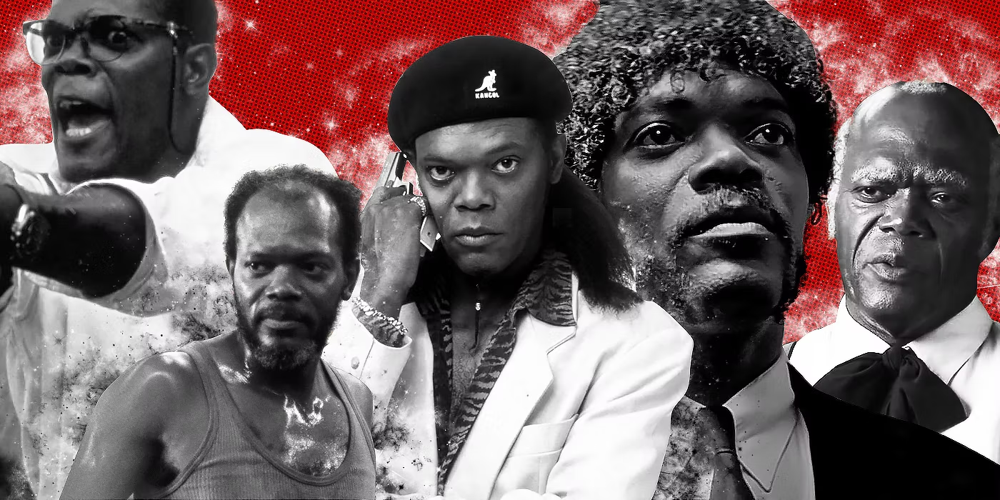

In [23]:
import javax.imageio.ImageIO
val image = ImageIO.read(File("../../src/main/resources/images/sam_jack.png"))
DISPLAY(image)

In [24]:
val rawJacksonMovies = movies
    .innerJoin(jacksonRoles) { id match jacksonRoles.movie_id }

rawJacksonMovies
val jacksonMovies = rawJacksonMovies.select { name and year and rank and jacksonRoles.role }
    .filter { rank!= null  }
    .sortBy { year and rank }

jacksonMovies

name,year,rank,role
Together for Days,1972,"3,200000",Stan
Ragtime,1981,"7,100000",Gang Member No. 2
Magic Sticks,1987,"6,000000",Bum
Eddie Murphy Raw,1987,"6,600000",Eddie's uncle (sketch)
School Daze,1988,"5,200000",Leeds
Coming to America,1988,"6,600000",Hold-up man
Sea of Love,1989,"6,700000",Criminal
Do the Right Thing,1989,"7,700000",Mister Senor Love Daddy
"Return of Superfly, The",1990,"3,200000",Nate Cabot
Def by Temptation,1990,"4,200000",Minister Garth


In [25]:
jacksonMovies.plot {
    area {
        x(year)
        y(rank)
        fillColor = Color.hex("#07C3F2")
        alpha = 0.5
        borderLine.width = 1.5
    }
    hLine {
        yIntercept.constant(jacksonMovies.mean { rank })
        color = Color.RED
        width = 2.0
        type = LineType.LONGDASH
    }
    layout.size = 1000 to 450
}

<head>
 <meta charset="UTF-8">
 <style> html, body { margin: 0; overflow: hidden; } </style>
 <script type="text/javascript" data-lets-plot-script="library" src="https://cdn.jsdelivr.net/gh/JetBrains/lets-plot@v4.2.0/js-package/distr/lets-plot.min.js"></script>
 </head>
 <body>
 <div id="hAMYQZ"></div>
 <script type="text/javascript" data-lets-plot-script="plot">
 var plotSpec={
"mapping":{
},
"data":{
"year":[1972.0,1981.0,1987.0,1987.0,1988.0,1988.0,1989.0,1989.0,1990.0,1990.0,1990.0,1990.0,1990.0,1990.0,1990.0,1991.0,1991.0,1991.0,1992.0,1992.0,1992.0,1992.0,1993.0,1993.0,1993.0,1993.0,1994.0,1994.0,1994.0,1994.0,1994.0,1995.0,1995.0,1995.0,1995.0,1996.0,1996.0,1996.0,1996.0,1996.0,1997.0,1997.0,1997.0,1997.0,1997.0,1998.0,1998.0,1998.0,1998.0,1999.0,1999.0,2000.0,2000.0,2000.0,2000.0,2001.0,2001.0,2002.0,2002.0,2002.0,2002.0,2003.0,2003.0,2003.0,2004.0,2004.0,2004.0,2004.0],
"rank":[3.200000047683716,7.099999904632568,6.0,6.599999904632568,5.199999809265137,6.599999904632568,6.699999809265137,7.699999809265137,3.200000047683716,4.199999809265137,5.5,5.599999904632568,6.099999904632568,6.5,8.600000381469727,4.800000190734863,5.800000190734863,6.400000095367432,4.5,4.800000190734863,5.800000190734863,6.800000190734863,5.099999904632568,5.300000190734863,7.300000190734863,7.699999809265137,2.700000047683716,4.900000095367432,5.599999904632568,7.400000095367432,8.699999809265137,5.800000190734863,6.0,6.0,7.0,5.300000190734863,6.5,6.900000095367432,7.099999904632568,7.300000190734863,3.799999952316284,5.5,6.300000190734863,7.199999809265137,7.5,5.199999809265137,7.199999809265137,7.300000190734863,7.699999809265137,5.599999904632568,6.5,6.0,6.300000190734863,6.400000095367432,7.099999904632568,6.0,6.199999809265137,5.5,5.599999904632568,6.699999809265137,7.099999904632568,6.0,6.199999809265137,7.199999809265137,4.199999809265137,4.599999904632568,6.199999809265137,8.199999809265137]
},
"ggsize":{
"width":1000.0,
"height":450.0
},
"kind":"plot",
"scales":[{
"aesthetic":"x",
"limits":[null,null]
},{
"aesthetic":"y",
"limits":[null,null]
}],
"layers":[{
"mapping":{
"x":"year",
"y":"rank"
},
"stat":"identity",
"size":1.5,
"sampling":"none",
"alpha":0.5,
"position":"identity",
"geom":"area",
"fill":"#07C3F2",
"data":{
}
},{
"mapping":{
},
"stat":"identity",
"yintercept":6.111764690455268,
"color":"#ee6666",
"size":2.0,
"linetype":"longdash",
"sampling":"none",
"position":"identity",
"geom":"hline",
"data":{
}
}]
};
 var plotContainer = document.getElementById("hAMYQZ");
 LetsPlot.buildPlotFromProcessedSpecs(plotSpec, -1, -1, plotContainer);
 </script>
 </body>
</html>"> 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 1,972 
 
 
 
 
 
 
 
 
 1,974 
 
 
 
 
 
 
 
 
 1,976 
 
 
 
 
 
 
 
 
 1,978 
 
 
 
 
 
 
 
 
 1,980 
 
 
 
 
 
 
 
 
 1,982 
 
 
 
 
 
 
 
 
 1,984 
 
 
 
 
 
 
 
 
 1,986 
 
 
 
 
 
 
 
 
 1,988 
 
 
 
 
 
 
 
 
 1,990 
 
 
 
 
 
 
 
 
 1,992 
 
 
 
 
 
 
 
 
 1,994 
 
 
 
 
 
 
 
 
 1,996 
 
 
 
 
 
 
 
 
 1,998 
 
 
 
 
 
 
 
 
 2,000 
 
 
 
 
 
 
 
 
 2,002 
 
 
 
 
 
 
 
 
 2,004 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 0 
 
 
 
 
 
 
 1 
 
 
 
 
 
 
 2 
 
 
 
 
 
 
 3 
 
 
 
 
 
 
 4 
 
 
 
 
 
 
 5 
 
 
 
 
 
 
 6 
 
 
 
 
 
 
 7 
 
 
 
 
 
 
 8 
 
 
 
 
 
 
 9 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M43.319063388385985 255.98138517475712 L43.319063388385985 255.98138517475712 L286.98879494806897 87.77120703293224 L449.43528265452187 135.21510105886512 L449.43528265452187 109.33661527802684 L476.50969727226766 169.71976247756683 L476.50969727226766 109.33661527802684 L503.58411189001345 105.02353774228311 L503.58411189001345 61.89272125209396 L530.658526507752 255.98138517475712 L530.658526507752 212.85057896775598 L530.658526507752 156.7805093039597 L530.658526507752 152.46743176821596 L530.658526507752 130.9020235231214 L530.658526507752 113.64969281377057 L530.658526507752 23.074961731272538 L557.7329411254977 186.9720726205417 L557.7329411254977 14

**Summary:**

In this notebook, we leveraged various exploratory methods to conduct a swift data analysis and visualization. However, one might ponder about its effectiveness from a performance standpoint.

Can loading all the tables into the **RAM** and manually conducting a **JOIN** operation be considered an efficient method? Is there a more effective alternative?

The answer is - we can potentially optimize the process by performing certain tasks on the database side. One such approach could be to map the results of an **SQL Query** directly to the DataFrame, reducing the computational load and improving performance.